In [44]:
import numpy as np
import pandas as pd
from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from IPython import display
import functions as f 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn import svm
from sklearn.neighbors import KNeighborsRegressor
%matplotlib inline
%config InlineBackend.figure_format='retina'



In [45]:
plt.style.use('seaborn')
mpl.rcParams['lines.linewidth'] = 2
#mpl.rcParams['figure.figsize'] = (6.4, 4.8)
mpl.rcParams['figure.figsize'] = (12, 9)
mpl.rcParams['axes.labelsize'] = 10
mpl.rcParams['xtick.labelsize'] = 8
mpl.rcParams['ytick.labelsize'] = 8
mpl.rcParams['figure.titlesize'] = 'xx-large' 
mpl.rcParams['axes.titlesize'] = 'large' 

mpl.rcParams['axes.titley'] = 1.03 

In [2]:
blue = sns.color_palette()[0]

In [3]:
df = pd.read_pickle('data/rent_cleaned.pkl')

In [4]:
df.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2651885 entries, 0 to 2651884
Data columns (total 73 columns):
 #   Column                            Non-Null Count    Dtype         
---  ------                            --------------    -----         
 0   obid                              2651885 non-null  int64         
 1   mietekalt                         2651885 non-null  float64       
 2   nebenkosten                       2490467 non-null  float64       
 3   heizkosten                        824489 non-null   float64       
 4   baujahr                           1682820 non-null  float64       
 5   letzte_modernisierung             556602 non-null   float64       
 6   wohnflaeche                       2651885 non-null  float64       
 7   nutzflaeche                       630468 non-null   float64       
 8   etage                             2167254 non-null  float64       
 9   anzahletagen                      1605995 non-null  float64       
 10  zimmeranzahl      

In [5]:
df.select_dtypes('float').info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2651885 entries, 0 to 2651884
Data columns (total 15 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   mietekalt              2651885 non-null  float64
 1   nebenkosten            2490467 non-null  float64
 2   heizkosten             824489 non-null   float64
 3   baujahr                1682820 non-null  float64
 4   letzte_modernisierung  556602 non-null   float64
 5   wohnflaeche            2651885 non-null  float64
 6   nutzflaeche            630468 non-null   float64
 7   etage                  2167254 non-null  float64
 8   anzahletagen           1605995 non-null  float64
 9   zimmeranzahl           2651445 non-null  float64
 10  schlafzimmer           1372067 non-null  float64
 11  badezimmer             1756338 non-null  float64
 12  ev_kennwert            800264 non-null   float64
 13  click_customer         1446675 non-null  float64
 14  rent_sqm          

In [6]:
df.ausstattung.value_counts(dropna=False)

NaN        1550469
Normal      523163
Gehoben     505691
Luxus        54878
Einfach      17684
Name: ausstattung, dtype: int64

In [7]:
columns = ['wohnflaeche',
       'aufzug', 'balkon',
       'einbaukueche', 'ev_wwenthalten', 'foerderung', 'gaestewc', 'garten',
       'heizkosten_in_wm_enthalten', 'keller', 'parkplatz', 'rollstuhlgerecht',
       'ausstattung', 'energieausweistyp',
       'haustier_erlaubt', 'heizungsart', 'kategorie_Wohnung', 'objektzustand',
       'anbieter',
       'Wärmezufuhr', 'Erdgas leicht', 'Erdgas schwer',
       'keine Information', 'Windenergie', 'Pellets', 'Solarenergie', 'Koks',
       'kombinierte erneuerbare Energie', 'Erdwärme', 'Bioenergie',
       'Wasserenergie', 'Nahwärme', 'Fernwärme', 'Holzschnitzel', 'Öl',
       'kombinierte regenerative Energie', 'Kohle',
       'kombinierte Fossilkraftstoffe', 'Gas', 'Holz', 'Heizdampf-Fernwärme',
       'thermische Umweltenergie', 'Flüssiggas', 'kombinierte Bio Energie',
       'Elektro']

In [8]:
clustering_df = df[columns]

In [170]:
df.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1680874 entries, 0 to 2651884
Data columns (total 74 columns):
 #   Column                            Non-Null Count    Dtype         
---  ------                            --------------    -----         
 0   obid                              1680874 non-null  int64         
 1   mietekalt                         1680874 non-null  float64       
 2   nebenkosten                       1626035 non-null  float64       
 3   heizkosten                        641036 non-null   float64       
 4   baujahr                           1680874 non-null  float64       
 5   letzte_modernisierung             428064 non-null   float64       
 6   wohnflaeche                       1680874 non-null  float64       
 7   nutzflaeche                       442550 non-null   float64       
 8   etage                             1444673 non-null  float64       
 9   anzahletagen                      1105269 non-null  float64       
 10  zimmeranzahl      

In [172]:
df.query('label=="66_7"').iloc[:,46:72].sum(axis=0)

Fernwärme                           557
kombinierte Bio Energie               0
Wärmezufuhr                           5
Öl                                   47
Heizdampf-Fernwärme                  14
Erdgas schwer                         8
thermische Umweltenergie              6
Holz                                  3
kombinierte regenerative Energie      0
Wasserenergie                         3
kombinierte Fossilkraftstoffe        18
Elektro                              51
kombinierte erneuerbare Energie       5
Flüssiggas                            0
Holzschnitzel                         0
Erdgas leicht                        46
Pellets                              16
Koks                                  0
Bioenergie                            2
Erdwärme                             31
Gas                                 507
keine Information                   547
Nahwärme                             14
Solarenergie                          5
Kohle                                 0


In [10]:
clustering_df.ausstattung.value_counts(dropna=False)

NaN        1550469
Normal      523163
Gehoben     505691
Luxus        54878
Einfach      17684
Name: ausstattung, dtype: int64

In [11]:
X, _ = f.clean_data(clustering_df)

In [12]:
X.columns

Index(['wohnflaeche', 'aufzug', 'balkon', 'einbaukueche', 'ev_wwenthalten',
       'foerderung', 'gaestewc', 'garten', 'heizkosten_in_wm_enthalten',
       'keller', 'parkplatz', 'rollstuhlgerecht', 'haustier_erlaubt',
       'Wärmezufuhr', 'Erdgas leicht', 'Erdgas schwer', 'keine Information',
       'Windenergie', 'Pellets', 'Solarenergie', 'Koks',
       'kombinierte erneuerbare Energie', 'Erdwärme', 'Bioenergie',
       'Wasserenergie', 'Nahwärme', 'Fernwärme', 'Holzschnitzel', 'Öl',
       'kombinierte regenerative Energie', 'Kohle',
       'kombinierte Fossilkraftstoffe', 'Gas', 'Holz', 'Heizdampf-Fernwärme',
       'thermische Umweltenergie', 'Flüssiggas', 'kombinierte Bio Energie',
       'Elektro', 'ausstattung_Einfach', 'ausstattung_Gehoben',
       'ausstattung_Luxus', 'ausstattung_Normal', 'ausstattung_nan',
       'energieausweistyp_Endenergiebedarf',
       'energieausweistyp_Energieverbrauchskennwert', 'energieausweistyp_nan',
       'heizungsart_Blockheizkraftwerke', 'h

In [13]:
X.ausstattung_nan.sum()

1550469

### Principal Component Analysis 

In [14]:
from sklearn.preprocessing import Normalizer

In [15]:
normalizer = Normalizer()
normalized_values = normalizer.fit_transform(X)

In [16]:
normalized_values

array([[0.99841685, 0.01560026, 0.01560026, ..., 0.        , 0.        ,
        0.01560026],
       [0.99846508, 0.015361  , 0.015361  , ..., 0.        , 0.        ,
        0.015361  ],
       [0.99859725, 0.01468525, 0.01468525, ..., 0.        , 0.        ,
        0.01468525],
       ...,
       [0.9992584 , 0.00933886, 0.00933886, ..., 0.        , 0.        ,
        0.        ],
       [0.99929826, 0.00908453, 0.00908453, ..., 0.        , 0.        ,
        0.        ],
       [0.99905488, 0.        , 0.01161692, ..., 0.        , 0.        ,
        0.        ]])

In [17]:
%%time
from sklearn.decomposition import PCA

# One less as original feature number
N_COMPONENTS = clustering_df.shape[1] - 1


pca = PCA(n_components=N_COMPONENTS)
pca.fit(normalized_values)

print('explained_variance_ratio_ vector:', pca.explained_variance_ratio_)
print('explained_variance_ratio_ sum:', pca.explained_variance_ratio_.sum())



explained_variance_ratio_ vector: [0.21636757 0.09860191 0.07595668 0.06105054 0.047894   0.0439709
 0.03941596 0.03423193 0.02997612 0.0286202  0.02758675 0.02561945
 0.02363541 0.02109442 0.01988983 0.01926228 0.01845784 0.0164975
 0.01575509 0.01436722 0.01365007 0.01102304 0.01025782 0.00964561
 0.00920707 0.00799868 0.00713279 0.00553892 0.00530388 0.00461204
 0.00370605 0.00326452 0.00306147 0.00277801 0.00260835 0.00232135
 0.00220871 0.00177704 0.0017442  0.00159852 0.00145907 0.00131834
 0.00125253 0.00115953]
explained_variance_ratio_ sum: 0.9928792177307632
CPU times: user 1min 22s, sys: 37.4 s, total: 2min
Wall time: 38.2 s


In [18]:
s = pd.DataFrame(pca.singular_values_)
v = pd.DataFrame(pca.components_)

In [66]:
f.explained_variance(s, 6)

0.5477419513737942

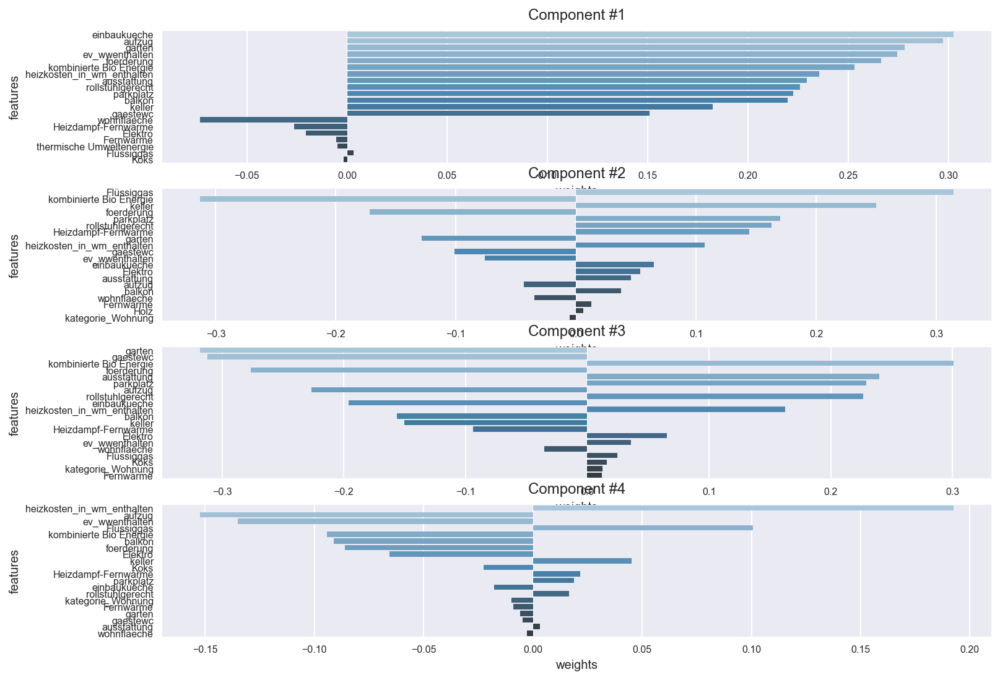

In [60]:

for i in range(4):
    plt.subplot(4,1,i+1)
    f.display_components(v, clustering_df.columns, i, n_weights=20)
    plt.title('Component #{}'.format(i+1))
figure.tight_layout()

    

## Setup K-Means
Create K-Means analysis to find groups in customers based only on customer features

### Create input data based on PCA analysis
Use the `pca.transform()` function to create input data for the K-Means analysis.

In [21]:
%%time
# Create input data from PCA Analysis
pca_transformed = pca.fit_transform(normalized_values)

pca_transformed = pd.DataFrame(pca_transformed)
pca_transformed = pca_transformed.iloc[:,:16]
PCA_list=range(1,17,1)
pca_transformed.columns=PCA_list

pca_transformed.head()



CPU times: user 1min 18s, sys: 33.2 s, total: 1min 51s
Wall time: 34.1 s


,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,-0.007330,0.008953,-0.005171,0.009505,-0.004109,-0.008285,0.014069,-0.008286,-0.003600,0.003494,-0.004819,-0.007665,-0.002617,-0.005080,-0.005708,0.001253
1,-0.006189,0.005418,-0.002914,0.017351,-0.002183,-0.004582,0.014038,-0.009500,-0.006548,0.003530,-0.005437,-0.010644,-0.003336,-0.006225,-0.004528,-0.003236
2,-0.009443,0.007983,-0.005757,0.009951,-0.003986,-0.007756,0.012564,-0.006843,-0.001972,0.002974,-0.002532,-0.004763,-0.001901,-0.004699,-0.006089,0.006696
3,-0.009443,0.007983,-0.005757,0.009951,-0.003986,-0.007756,0.012564,-0.006843,-0.001972,0.002974,-0.002532,-0.004763,-0.001901,-0.004699,-0.006089,0.006696
4,-0.009443,0.007983,-0.005757,0.009951,-0.003986,-0.007756,0.012564,-0.006843,-0.001972,0.002974,-0.002532,-0.004763,-0.001901,-0.004699,-0.006089,0.006696


In [22]:
%%time
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist


# Do a loop over different k's to find the optimum
inertias = []
distortions = []
for i in range(1,12):
    kmeans = KMeans(n_clusters=i).fit(pca_transformed)
    cluster_centers = kmeans.cluster_centers_
    inertias.append(kmeans.inertia_)
    
    distortions.append(sum(np.min(cdist(pca_transformed, kmeans.cluster_centers_,
                                        'euclidean'), axis=1)) / pca_transformed.shape[0])
                                        
    inertias.append(kmeans.inertia_)
    

CPU times: user 40min 6s, sys: 5min 32s, total: 45min 38s
Wall time: 6min 28s


In [23]:
distortions

[0.036435631532805754,
 0.03334709276314173,
 0.0322460723856752,
 0.031261616068572085,
 0.030371847666017738,
 0.02989454685877871,
 0.029376412985534,
 0.028926741805380997,
 0.028492025096456583,
 0.028228777547823256,
 0.027913767181116197]

<AxesSubplot:>

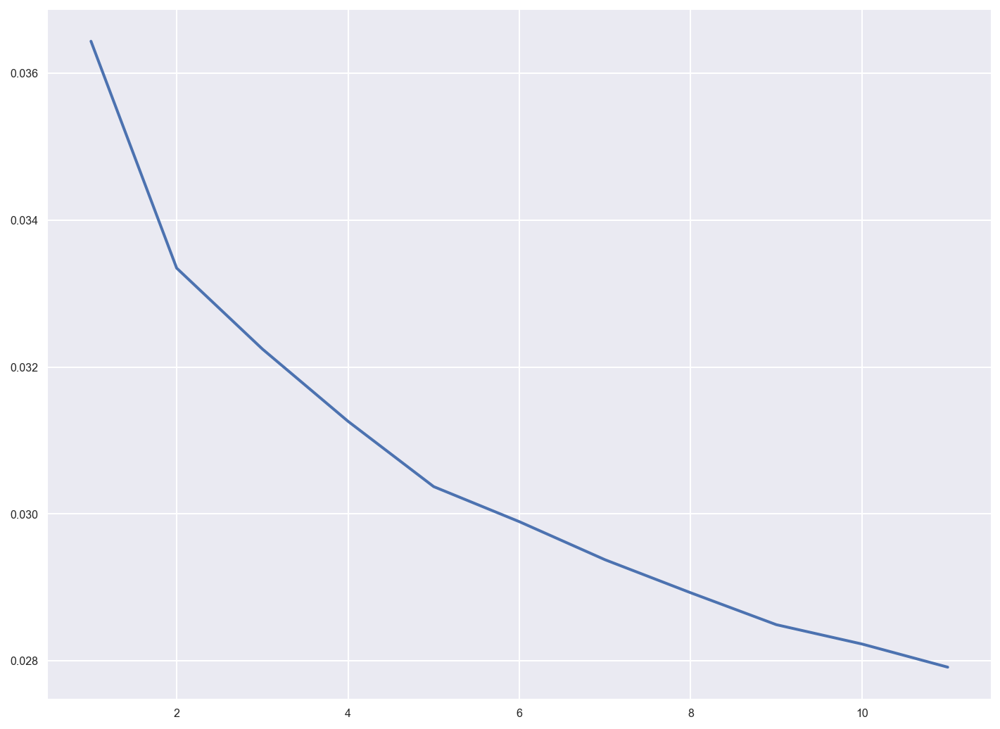

In [46]:
sns.lineplot(x=range(1,12), y=distortions)

In [25]:
%%time
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=6).fit(pca_transformed)
labels = kmeans.labels_

CPU times: user 2min 41s, sys: 20.6 s, total: 3min 2s
Wall time: 27.6 s


In [26]:
cluster_df = pd.DataFrame(kmeans.cluster_centers_, columns=pca_transformed.columns)


Text(0.5, 1.03, 'Attribute Value by Centroid')

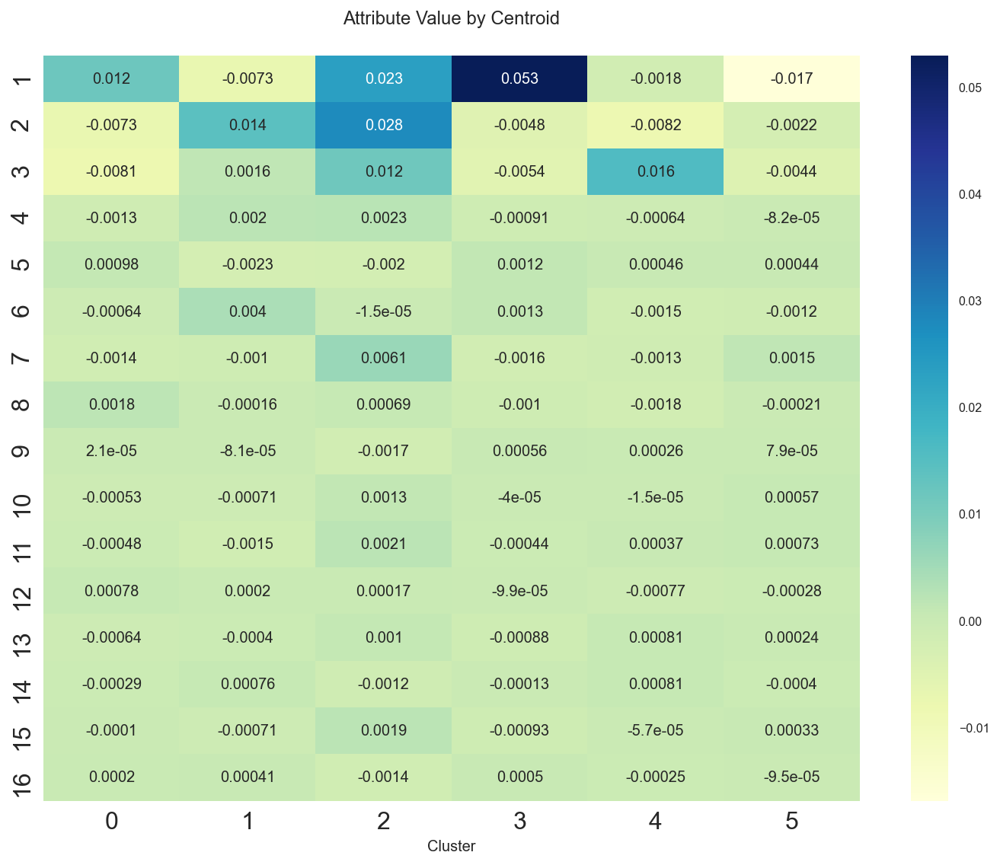

In [47]:
ax = sns.heatmap(cluster_df.T, cmap = 'YlGnBu', annot=True)
ax.set_xlabel("Cluster")
plt.yticks(fontsize = 16)
plt.xticks(fontsize = 16)
ax.set_title("Attribute Value by Centroid")



In [28]:
df.loc[:, 'label'] = labels

In [29]:
df['Gas'].value_counts()

0    2597913
1      53972
Name: Gas, dtype: int64

In [97]:
ticks = [0, 3, 4, 1, 2]
#label_mapping = {4:'very high priced', 1:'high priced', 3:'normal priced', 0:'low priced', 2:'very low priced'}
#label_mapping = {0:'high priced', 2:'normal priced', 1:'low priced'}
label_mapping = {0: '66_7',
               1: '59_9',
               2: '36_11',
               3: '39_8',
               4: '58_8',
               5: '96_10'}

df.label = df.label.map(label_mapping)



In [112]:
df = f.remove_outlier(df, ['baujahr'])

df.baujahr.value_counts(dropna=False)

1900.0    108472
1910.0     45293
1960.0     45095
1996.0     32926
1997.0     32441
           ...  
1852.0        16
1842.0        13
1843.0        11
1841.0         5
1851.0         3
Name: baujahr, Length: 180, dtype: int64

In [113]:
df.ausstattung.fillna('Unbekannt', inplace=True)

/Users/florian/opt/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [114]:
city_count = df.groupby(['City', 'year']).label.value_counts(normalize=True).reset_index(name='label_ratio')
wohnflaeche = df.groupby(['City', 'year', 'label']).wohnflaeche.mean().reset_index(name='wohnflaeche_mean')
baujahr = df.groupby(['City', 'year', 'label']).baujahr.mean().reset_index(name='baujahr_mean')
rent_sqm = df.groupby(['City', 'year', 'label']).rent_sqm.mean().reset_index(name='rent_sqm_mean')
miete_mean = df.groupby(['City', 'year', 'label']).mietekalt.mean().reset_index(name='mietekalt_mean')
laufzeittage = df.groupby(['City', 'year', 'label']).laufzeittage.mean().reset_index(name='laufzeittage_mean')
anzahletagen = df.groupby(['City', 'year', 'label']).anzahletagen.mean().reset_index(name='anzahletagen_mean')
zimmeranzahl = df.groupby(['City', 'year', 'label']).zimmeranzahl.mean().reset_index(name='zimmeranzahl_mean')
schlafzimmer = df.groupby(['City', 'year', 'label']).schlafzimmer.mean().reset_index(name='schlafzimmer_mean')


summary =miete_mean.merge(wohnflaeche, left_on=['City', 'year', 'label'], right_on=['City', 'year', 'label']) \
.merge(baujahr, left_on=['City', 'year', 'label'], right_on=['City', 'year', 'label']) \
.merge(rent_sqm, left_on=['City', 'year', 'label'], right_on=['City', 'year', 'label']) \
.merge(laufzeittage, left_on=['City', 'year', 'label'], right_on=['City', 'year', 'label']) \
.merge(anzahletagen, left_on=['City', 'year', 'label'], right_on=['City', 'year', 'label']) \
.merge(zimmeranzahl, left_on=['City', 'year', 'label'], right_on=['City', 'year', 'label']) \
.merge(schlafzimmer, left_on=['City', 'year', 'label'], right_on=['City', 'year', 'label']) \
.merge(city_count, left_on=['City', 'year', 'label'], right_on=['City', 'year', 'label'])







In [115]:
city_count = df.groupby(['City', 'year', 'ausstattung']).label.value_counts(normalize=True).reset_index(name='label_ratio')
wohnflaeche = df.groupby(['City', 'year', 'label', 'ausstattung']).wohnflaeche.mean().reset_index(name='wohnflaeche_mean')
baujahr = df.groupby(['City', 'year', 'label', 'ausstattung']).baujahr.mean().reset_index(name='baujahr_mean')
rent_sqm = df.groupby(['City', 'year', 'label', 'ausstattung']).rent_sqm.mean().reset_index(name='rent_sqm_mean')
miete_mean = df.groupby(['City', 'year', 'label', 'ausstattung']).mietekalt.mean().reset_index(name='mietekalt_mean')
laufzeittage = df.groupby(['City', 'year', 'label', 'ausstattung']).laufzeittage.mean().reset_index(name='laufzeittage_mean')
anzahletagen = df.groupby(['City', 'year', 'label', 'ausstattung']).anzahletagen.mean().reset_index(name='anzahletagen_mean')
zimmeranzahl = df.groupby(['City', 'year', 'label', 'ausstattung']).zimmeranzahl.mean().reset_index(name='zimmeranzahl_mean')
schlafzimmer = df.groupby(['City', 'year', 'label', 'ausstattung']).schlafzimmer.mean().reset_index(name='schlafzimmer_mean')


summary_ausstattung =miete_mean.merge(wohnflaeche, left_on=['City', 'year', 'label', 'ausstattung'], right_on=['City', 'year', 'label', 'ausstattung']) \
.merge(baujahr, left_on=['City', 'year', 'label', 'ausstattung'], right_on=['City', 'year', 'label', 'ausstattung']) \
.merge(rent_sqm, left_on=['City', 'year', 'label', 'ausstattung'], right_on=['City', 'year', 'label', 'ausstattung']) \
.merge(laufzeittage, left_on=['City', 'year', 'label', 'ausstattung'], right_on=['City', 'year', 'label', 'ausstattung']) \
.merge(anzahletagen, left_on=['City', 'year', 'label', 'ausstattung'], right_on=['City', 'year', 'label', 'ausstattung']) \
.merge(zimmeranzahl, left_on=['City', 'year', 'label', 'ausstattung'], right_on=['City', 'year', 'label', 'ausstattung']) \
.merge(schlafzimmer, left_on=['City', 'year', 'label', 'ausstattung'], right_on=['City', 'year', 'label', 'ausstattung']) \
.merge(city_count, left_on=['City', 'year', 'label', 'ausstattung'], right_on=['City', 'year', 'label', 'ausstattung'])







In [124]:
label_order = ['low priced', 'normal priced', 'high priced']
ausstattung_order = ['Einfach', 'Normal', 'Gehoben', 'Luxus', 'Unbekannt']

 

In [126]:
df.anbieter = df.anbieter.fillna('unbekannt')

/Users/florian/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


<AxesSubplot:xlabel='label', ylabel='count'>

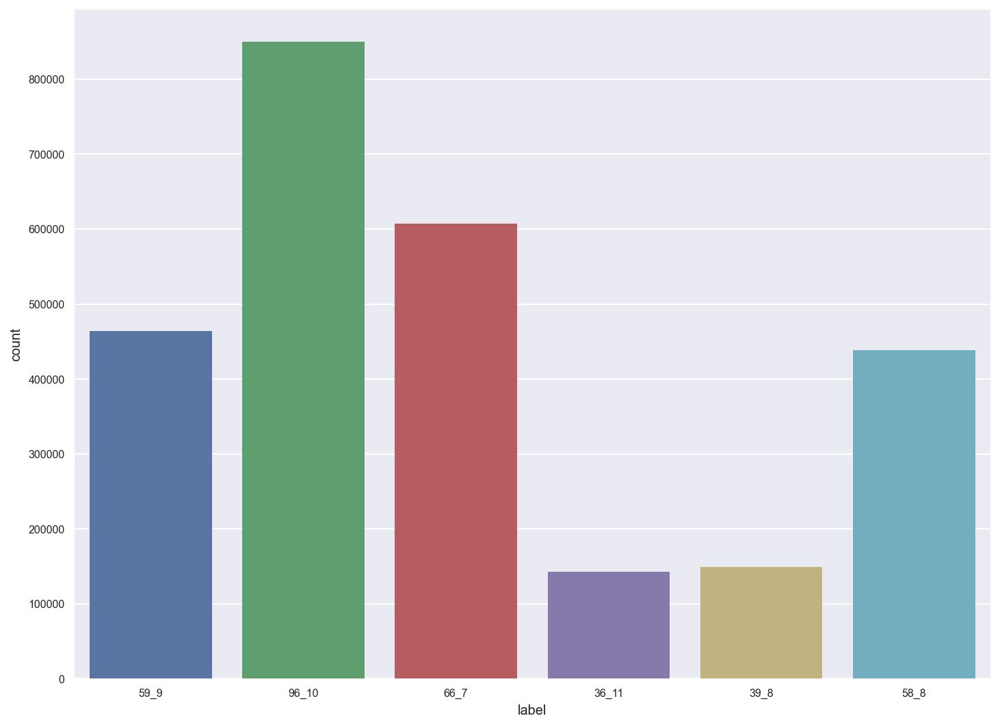

In [103]:
df.label.value_counts()
sns.countplot(data=df, x='label')

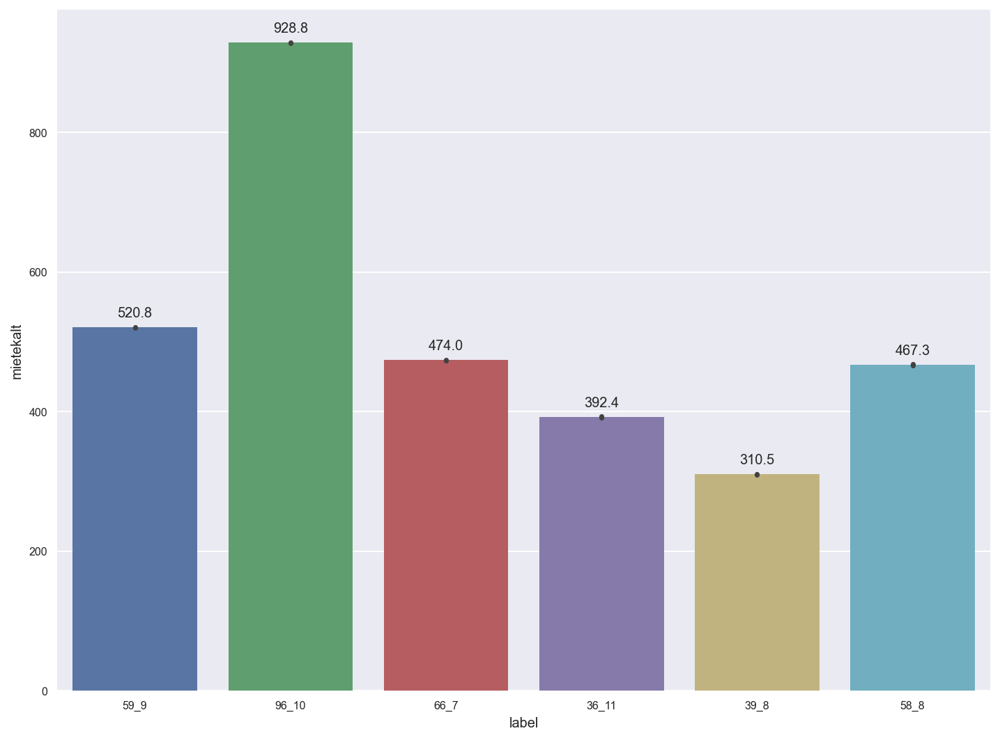

In [106]:
plt.figure(figsize=(12, 9))
ax = sns.barplot(data=df, x='label', y='mietekalt');
for p in ax.patches:
    text = format(p.get_height(), '.1f')
    xy = (p.get_x() + p.get_width() / 2, p.get_y() + p.get_height())
    ax.annotate(text, xy, ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')



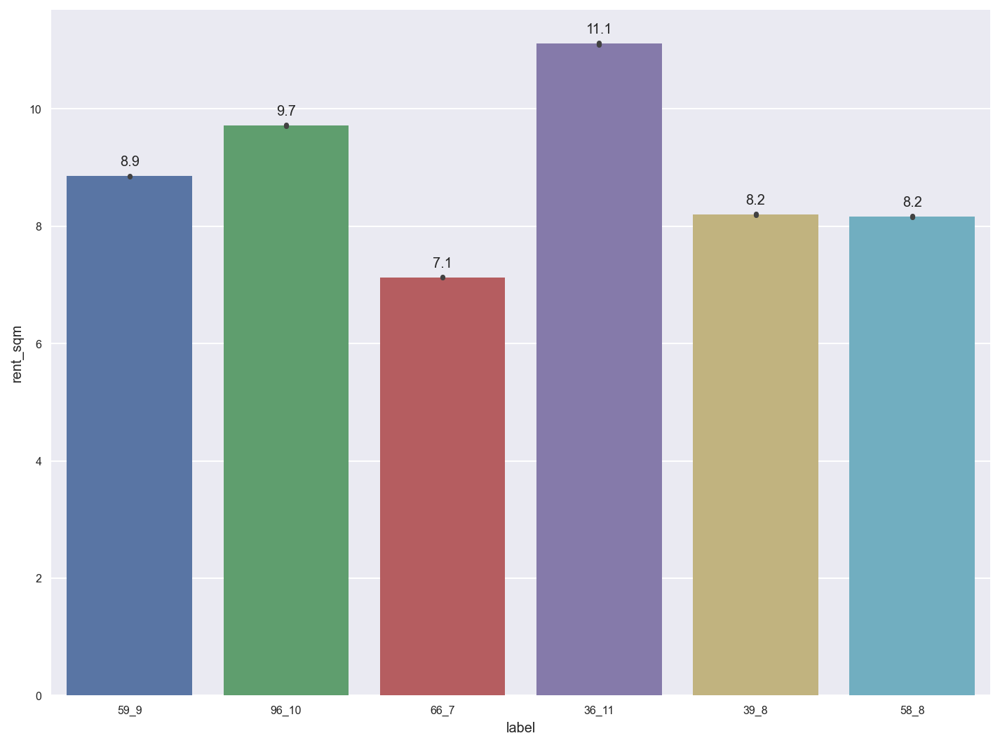

In [105]:
ax = sns.barplot(data=df, x='label', y='rent_sqm');

for p in ax.patches:
    text = format(p.get_height(), '.1f')
    xy = (p.get_x() + p.get_width() / 2, p.get_y() + p.get_height())
    ax.annotate(text, xy, ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')



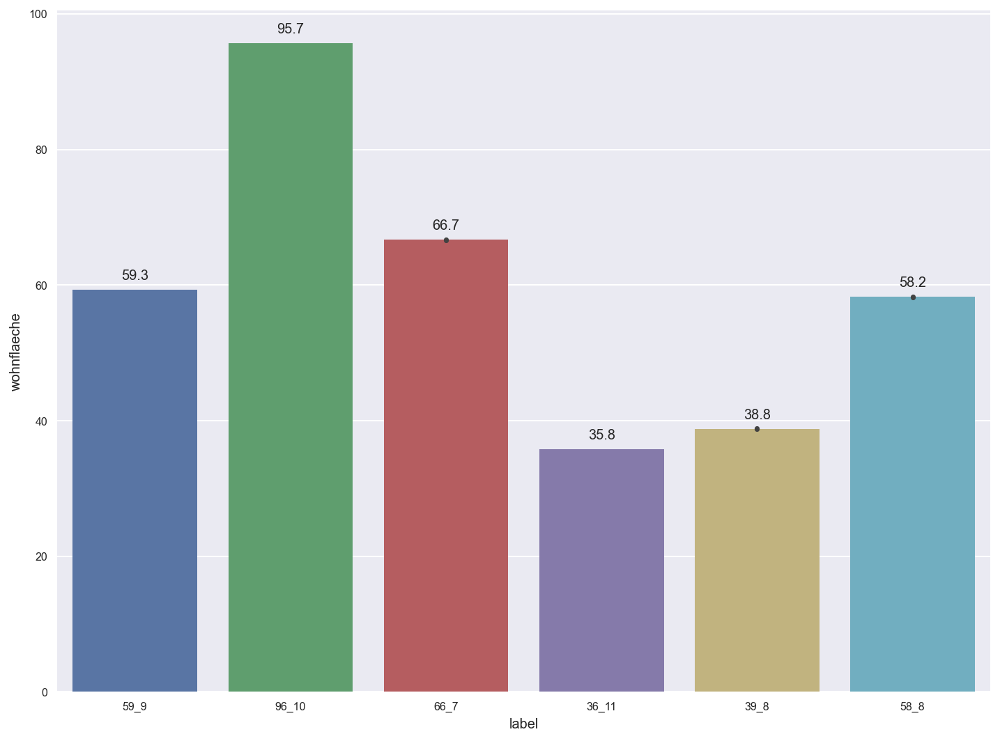

In [107]:
ax = sns.barplot(data=df, x='label', y='wohnflaeche');
for p in ax.patches:
    text = format(p.get_height(), '.1f')
    xy = (p.get_x() + p.get_width() / 2, p.get_y() + p.get_height())
    ax.annotate(text, xy, ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')



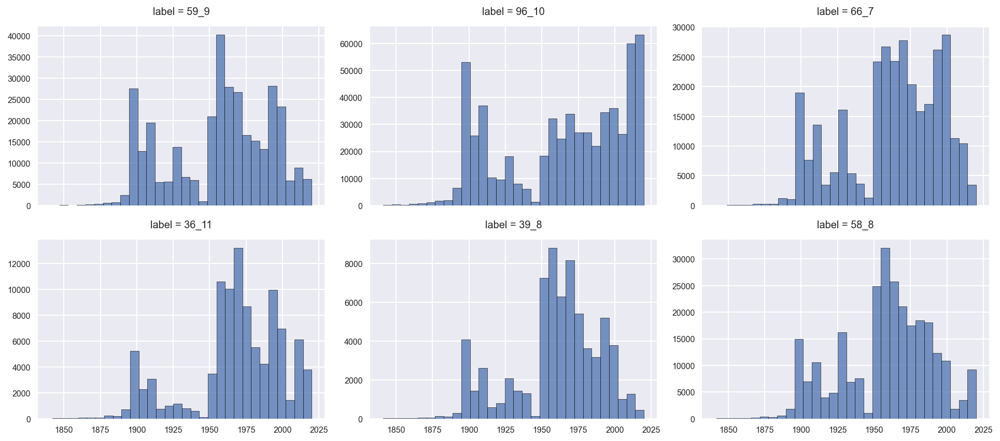

In [117]:
g = sns.FacetGrid(data=df, col='label', col_wrap=3, sharey = False, height=3, aspect=1.5)
g.map_dataframe(sns.histplot, x='baujahr', bins=30)

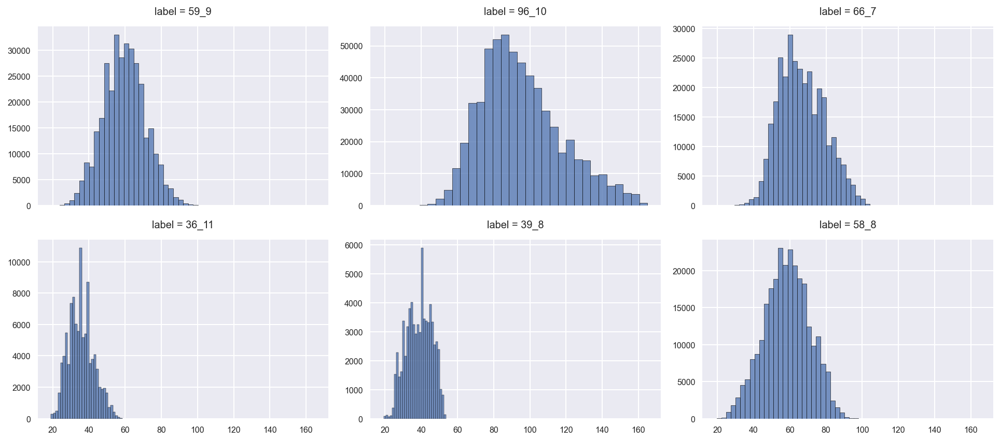

In [118]:
g = sns.FacetGrid(data=df, col='label', col_wrap=3, sharey = False, height=3, aspect=1.5)
g.map_dataframe(sns.histplot, x='wohnflaeche', bins=30)

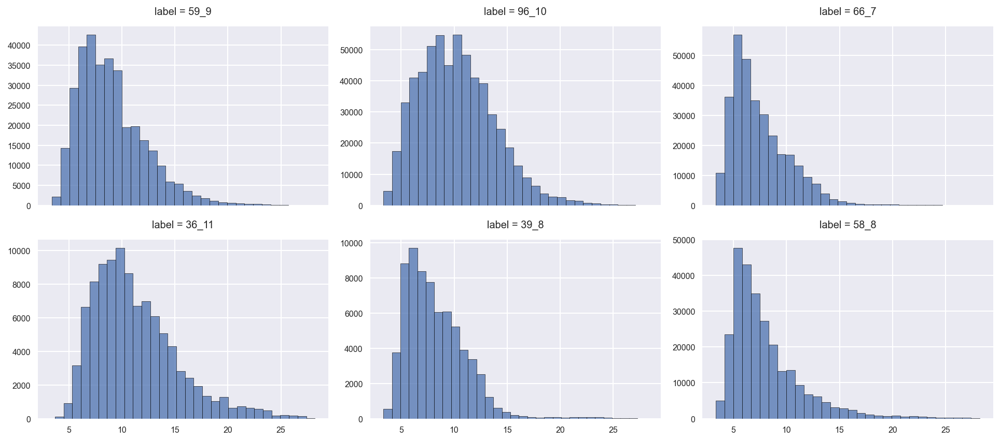

In [119]:
g = sns.FacetGrid(data=df, col='label', col_wrap=3, sharey = False, height=3, aspect=1.5)
g.map_dataframe(sns.histplot, x='rent_sqm', bins=30)

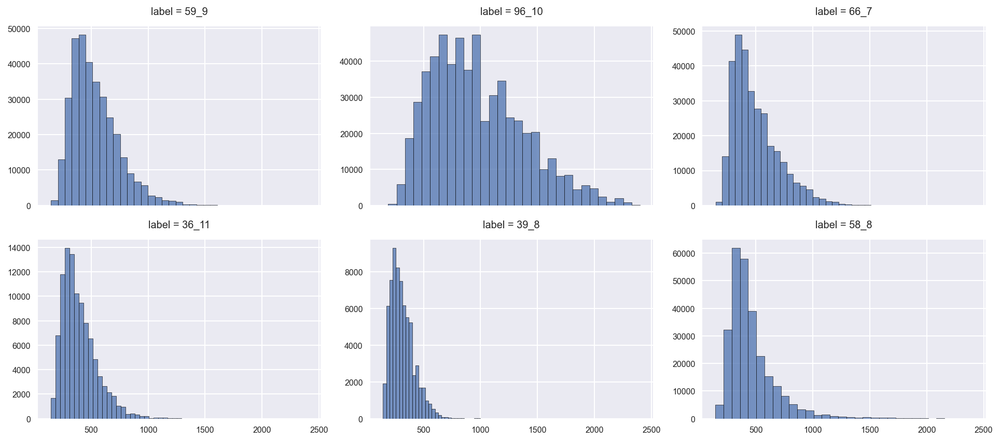

In [120]:
g = sns.FacetGrid(data=df, col='label', col_wrap=3, sharey = False, height=3, aspect=1.5)
g.map_dataframe(sns.histplot, x='mietekalt', bins=30)

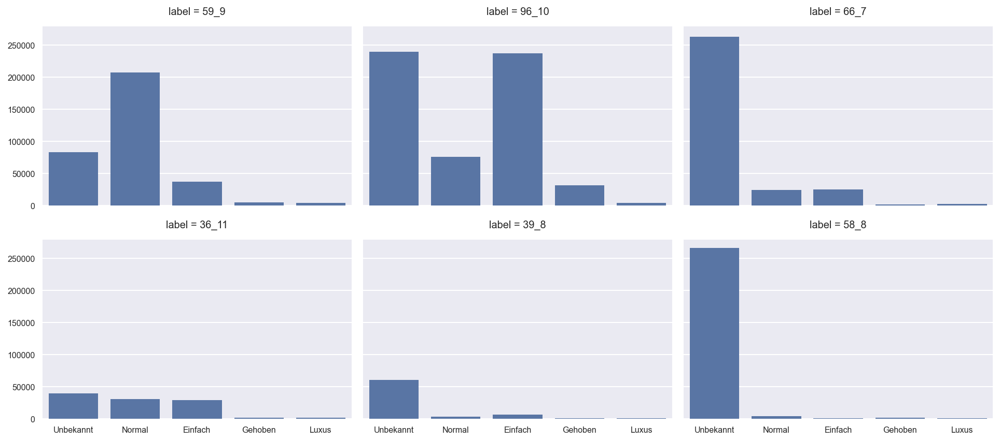

In [137]:
g = sns.FacetGrid(data=df, col='label', col_wrap=3, sharey = True, height=3, aspect=1.5)
g.map_dataframe(sns.countplot, x='ausstattung')

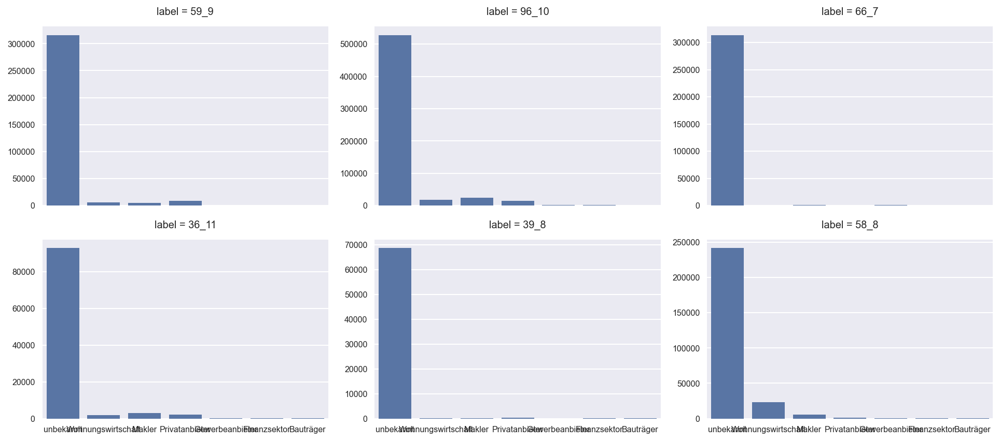

In [127]:
g = sns.FacetGrid(data=df, col='label', col_wrap=3, sharey = False, height=3, aspect=1.5)
g.map_dataframe(sns.countplot, x='anbieter')


In [134]:
city_order = np.sort(df.City.unique())

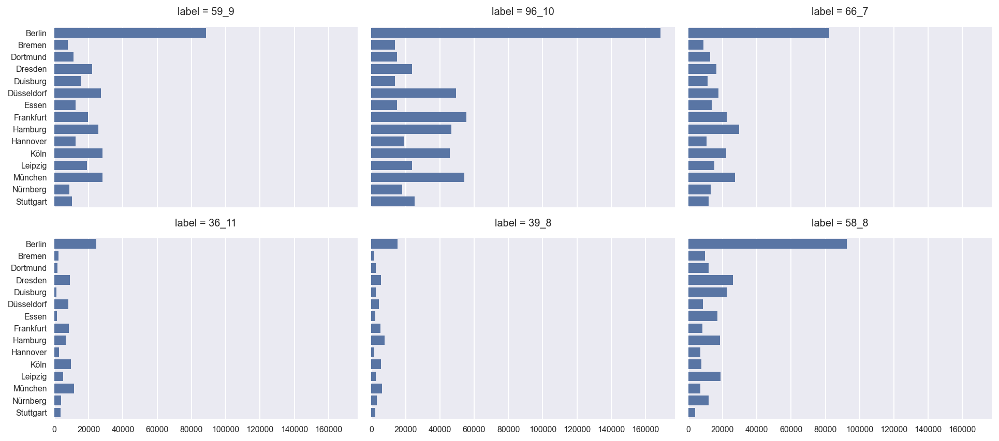

In [135]:
g = sns.FacetGrid(data=df, col='label', col_wrap=3, sharey = True, height=3, aspect=1.5)
g.map_dataframe(sns.countplot, y='City', order=city_order)


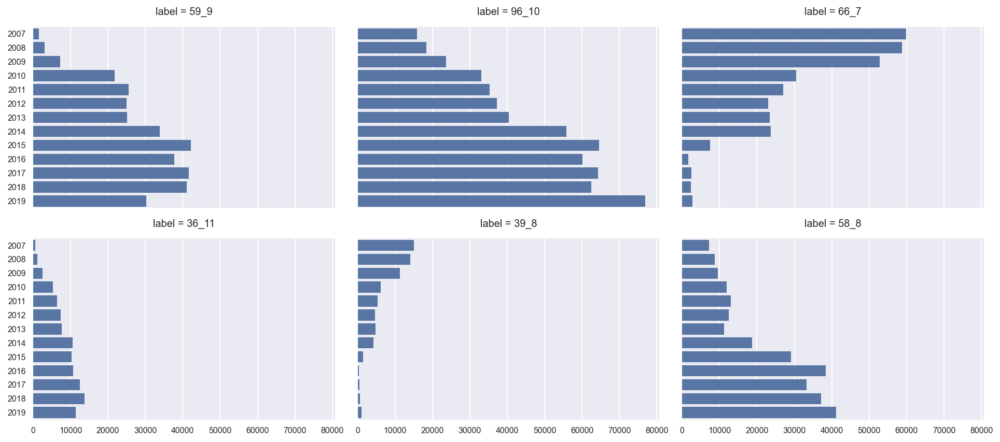

In [136]:
g = sns.FacetGrid(data=df, col='label', col_wrap=3, sharey = True, height=3, aspect=1.5)
g.map_dataframe(sns.countplot, y='year')


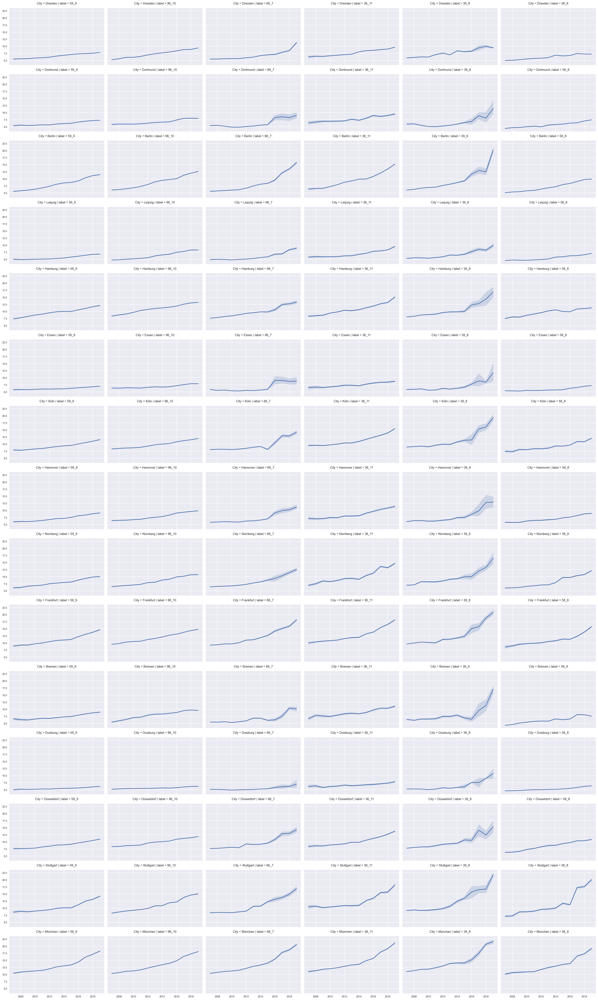

In [140]:
g = sns.FacetGrid(data=df, col='label', row='City', sharey = True, height=3, aspect=1.5)
g.map_dataframe(sns.lineplot, x='year', y='rent_sqm')


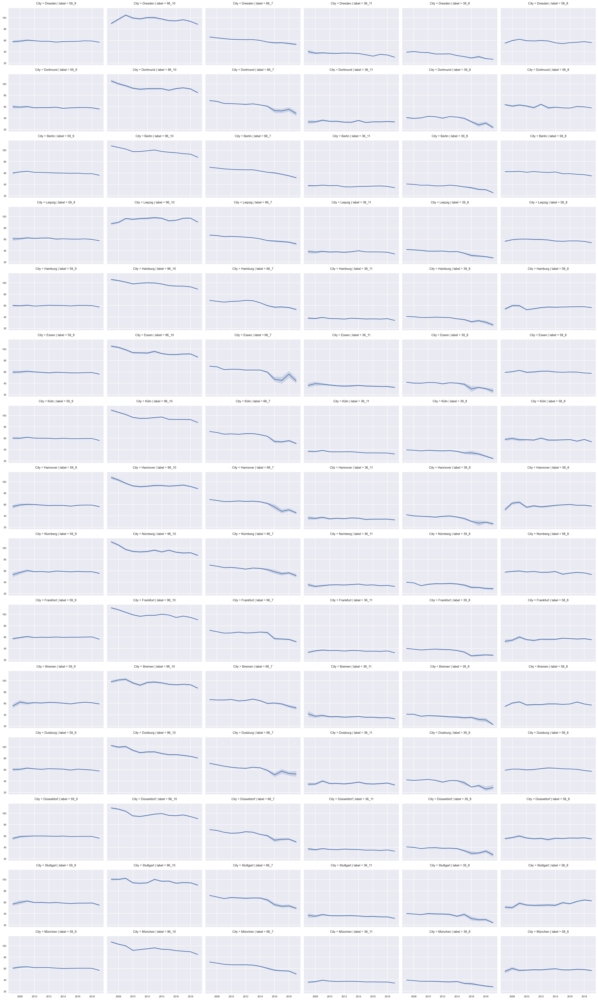

In [141]:
g = sns.FacetGrid(data=df, col='label', row='City', sharey = True, height=3, aspect=1.5)
g.map_dataframe(sns.lineplot, x='year', y='wohnflaeche')


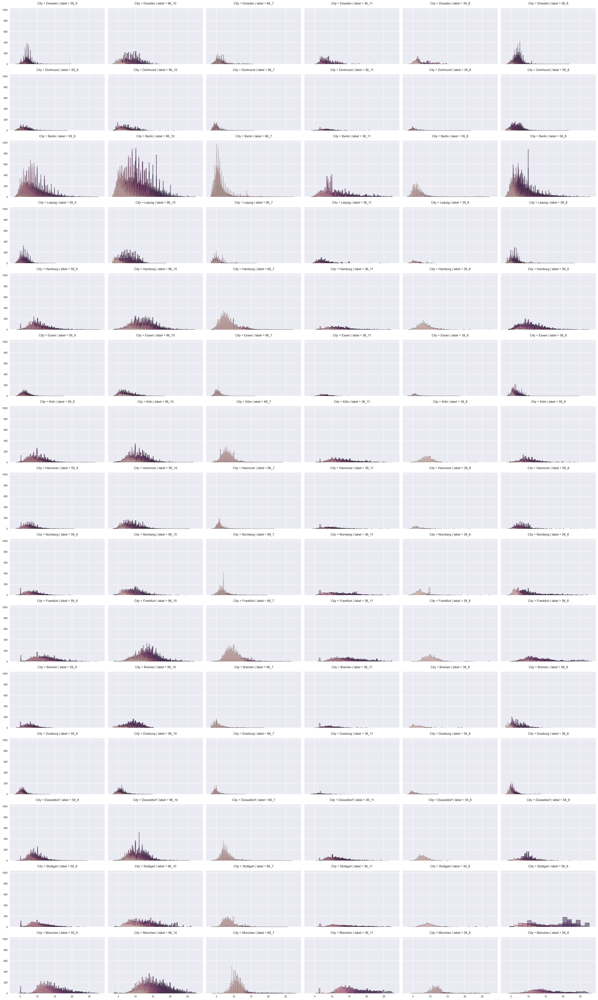

In [144]:
g = sns.FacetGrid(data=df, col='label', row='City', sharey = True, height=3, aspect=1.5)
g.map_dataframe(sns.histplot, x='rent_sqm', hue='year')


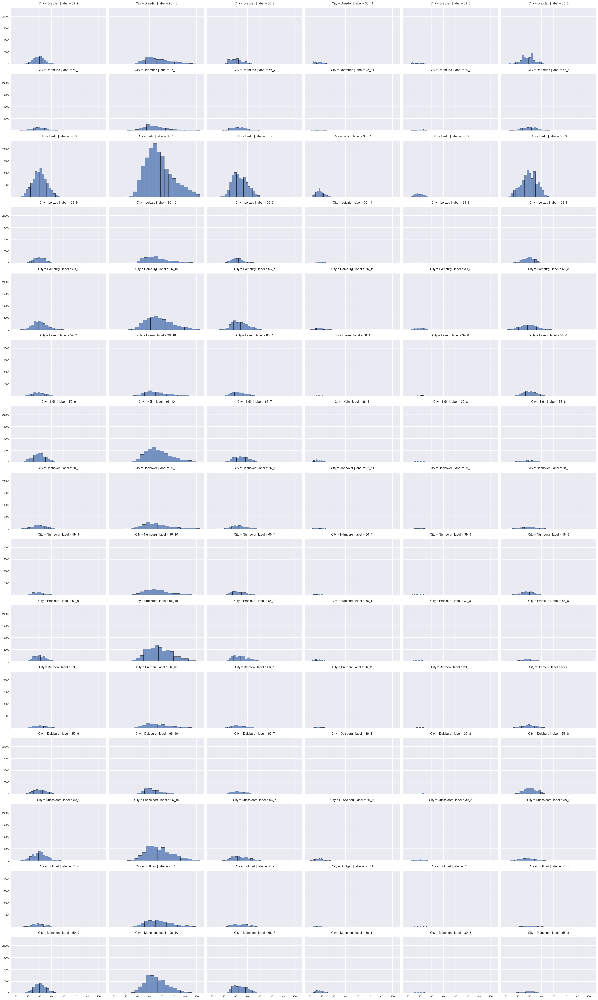

In [145]:
g = sns.FacetGrid(data=df, col='label', row='City', sharey = True, height=3, aspect=1.5)
g.map_dataframe(sns.histplot, x='wohnflaeche', bins=20)


<AxesSubplot:xlabel='wohnflaeche', ylabel='rent_sqm'>

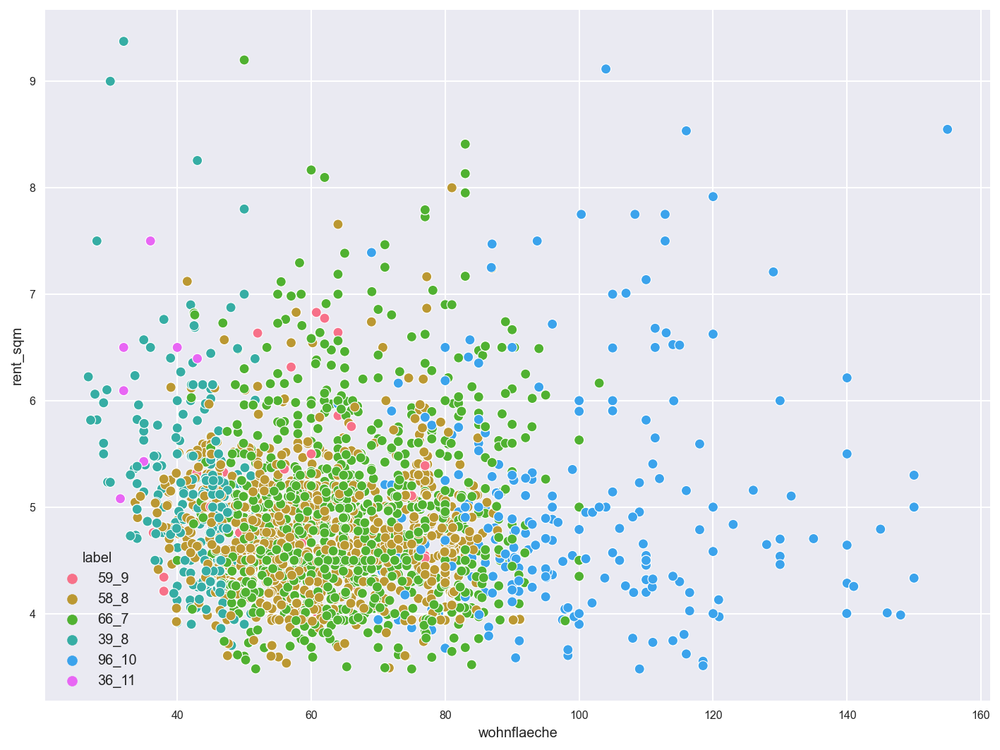

In [163]:




sns.scatterplot(data=df.query('City == "Duisburg" and ausstattung=="Unbekannt" and year=="2009" and Öl==0'), x='wohnflaeche', y='rent_sqm', hue='label', palette='husl')

<AxesSubplot:xlabel='wohnflaeche_mean', ylabel='rent_sqm_mean'>

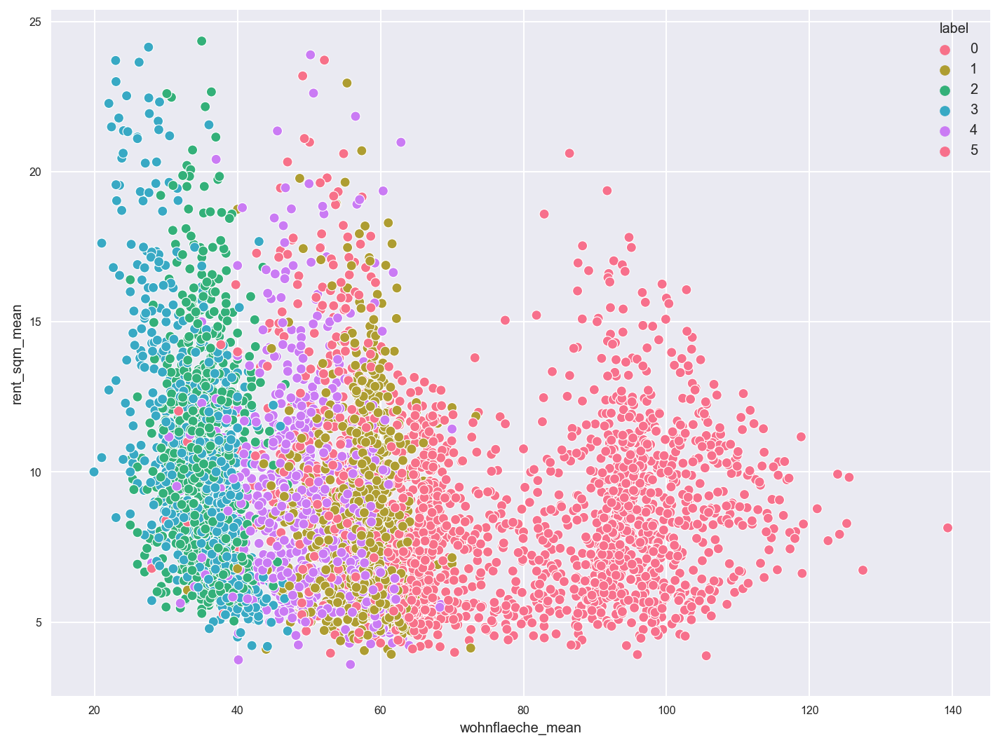

In [95]:
plt.figure(figsize=(12,9))

sns.scatterplot(data=summary_ausstattung, x='wohnflaeche_mean', y='rent_sqm_mean', hue='label', palette='husl')

<AxesSubplot:xlabel='wohnflaeche_mean', ylabel='rent_sqm_mean'>

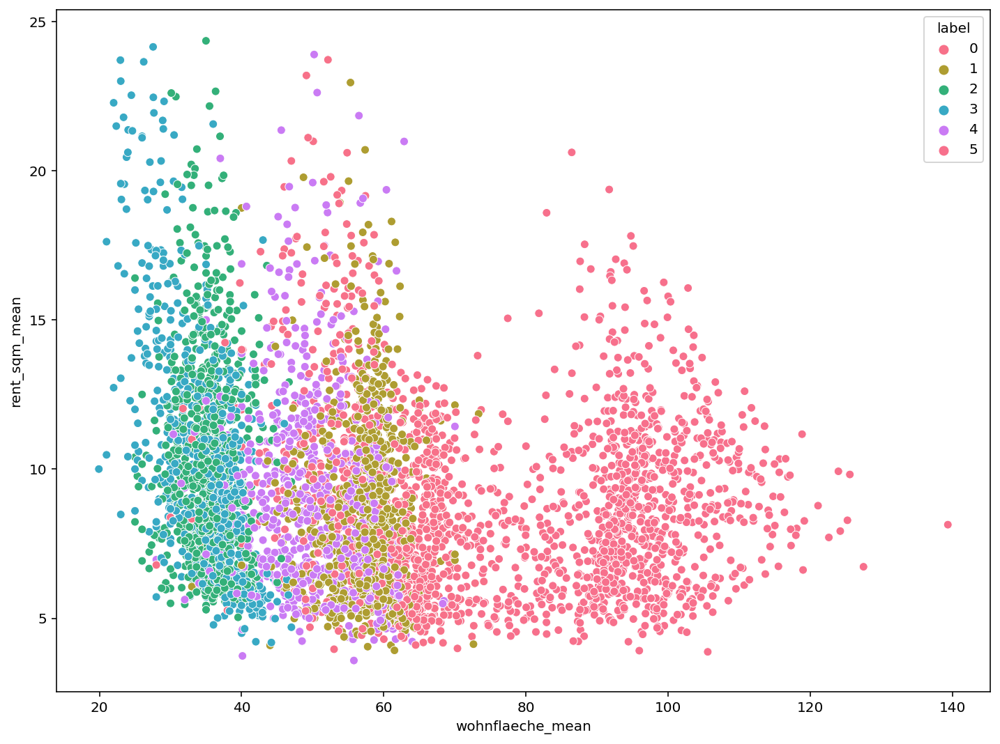

In [36]:
plt.figure(figsize=(12,9))

sns.scatterplot(data=summary_ausstattung, x='wohnflaeche_mean', y='rent_sqm_mean', hue='label', palette='husl')

<AxesSubplot:xlabel='wohnflaeche_mean', ylabel='rent_sqm_mean'>

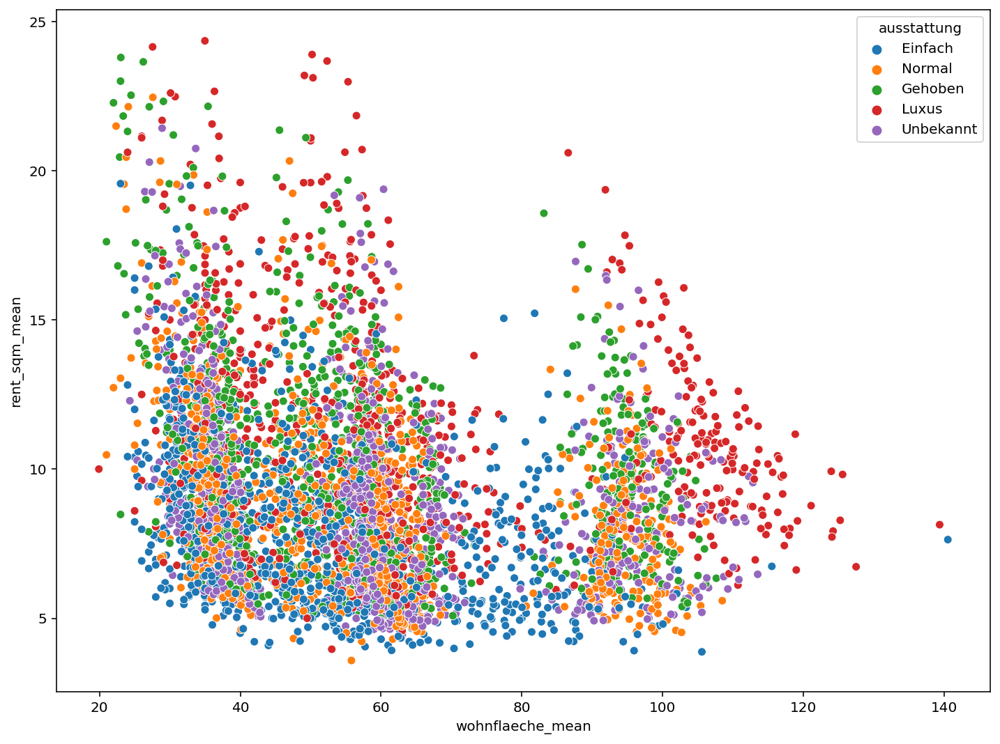

In [70]:
plt.figure(figsize=(12,9))

hue_order = ['Einfach', 'Normal', 'Gehoben', 'Luxus', 'Unbekannt']
sns.scatterplot(data=summary_ausstatung, x='wohnflaeche_mean', y='rent_sqm_mean', hue='ausstattung', hue_order=ausstattung_order)

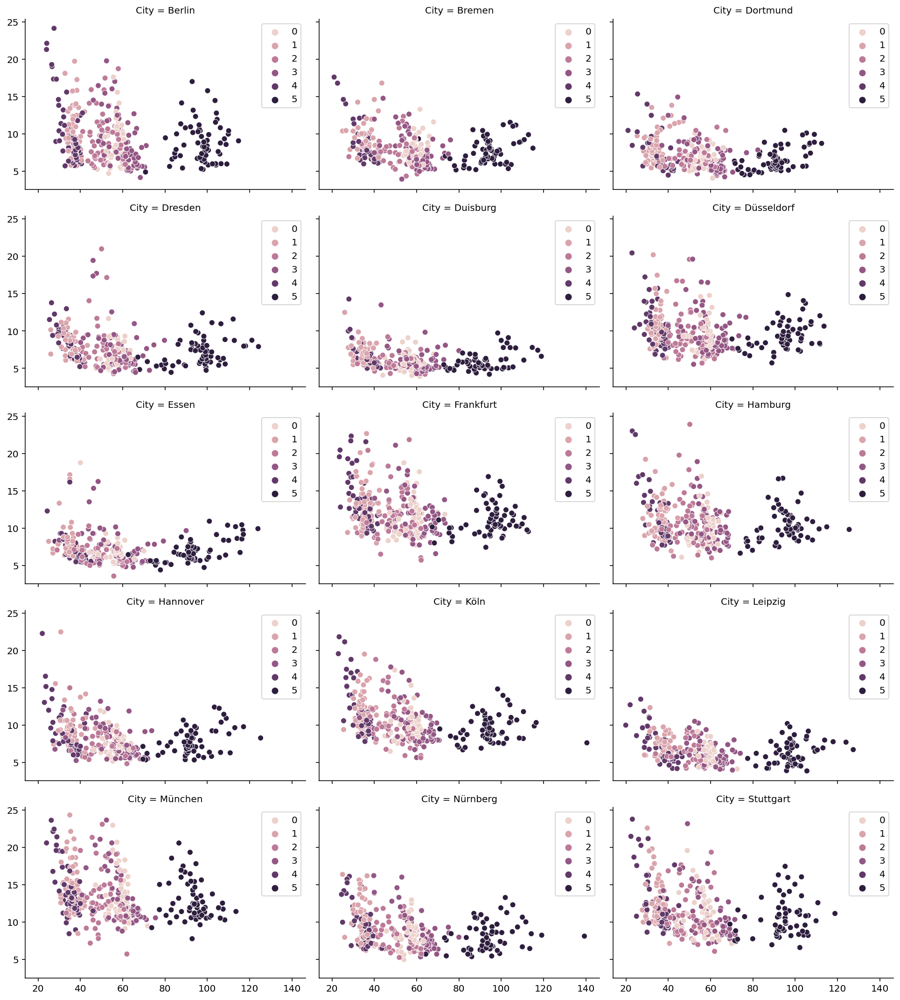

In [71]:


g = sns.FacetGrid(data=summary_ausstatung, col='City', col_wrap=3, height=3, aspect=1.5)
g.map_dataframe(sns.scatterplot, x='wohnflaeche_mean', y='rent_sqm_mean', hue='label', hue_order=label_order)

for ax in g.axes.ravel():
    ax.legend()

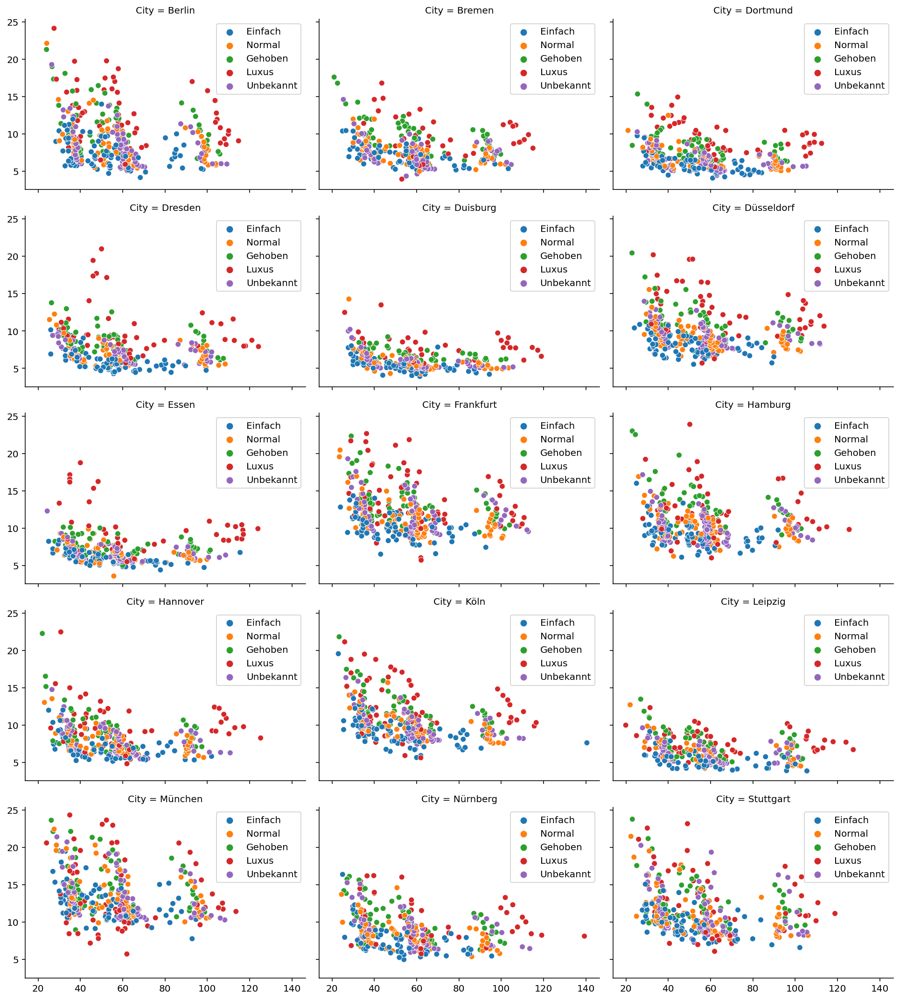

In [72]:
hue_order = ['Einfach', 'Normal', 'Gehoben', 'Luxus', 'Unbekannt']
g = sns.FacetGrid(data=summary_ausstatung, col='City', col_wrap=3, height=3, aspect=1.5)
g.map_dataframe(sns.scatterplot, x='wohnflaeche_mean', y='rent_sqm_mean', hue='ausstattung', hue_order=ausstattung_order)

for ax in g.axes.ravel():
    ax.legend()

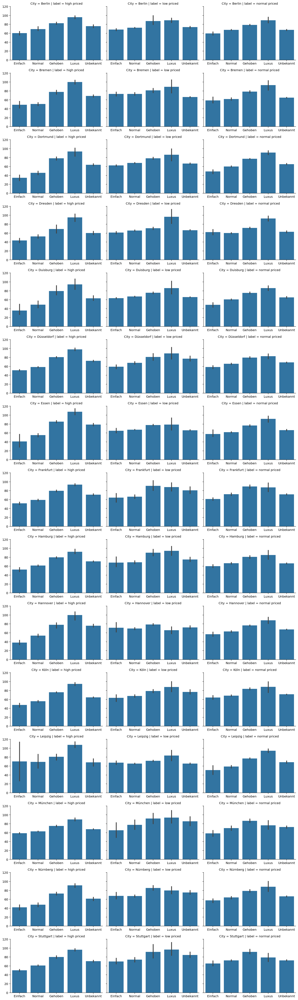

In [149]:
g = sns.FacetGrid(data=summary_ausstatung, col='label', row='City', height=3, aspect=1.5, sharex=False)
g.map_dataframe(sns.barplot, x='ausstattung', y='wohnflaeche_mean', order=ausstattung_order)


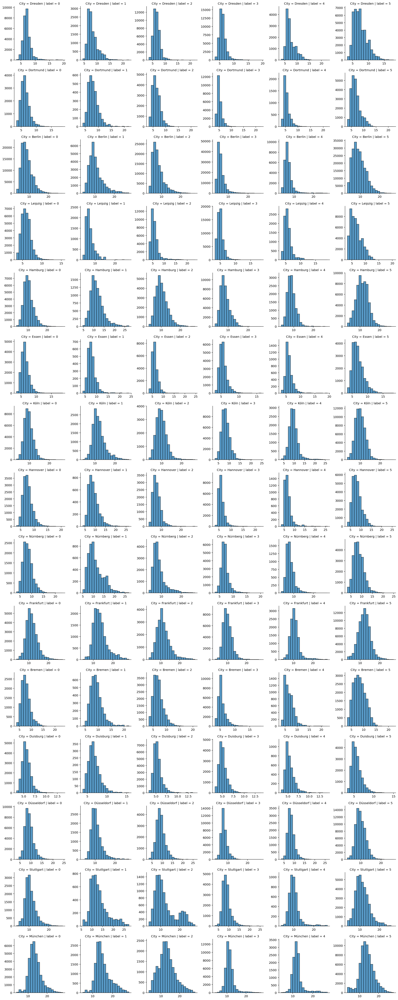

In [74]:
g = sns.FacetGrid(data=df, col='label', row='City', sharex=False, sharey=False)
g.map_dataframe(sns.histplot, x='rent_sqm', bins=20)



In [143]:
df.groupby(['year', 'City']).label.value_counts(normalize=True)
summary.head()

,City,year,label,mietekalt_mean,wohnflaeche_mean,baujahr_mean,rent_sqm_mean,laufzeittage_mean,anzahletagen_mean,zimmeranzahl_mean,schlafzimmer_mean,label_ratio
0,Berlin,2007,high priced,850.315992,86.077514,1956.805616,9.883972,37.520315,4.551789,2.630988,1.625761,0.033083
1,Berlin,2007,low priced,348.581380,71.534563,1949.994466,4.899662,34.933999,4.801906,2.545678,1.477085,0.628910
2,Berlin,2007,normal priced,481.604675,70.684073,1948.874569,6.779317,31.721629,4.193352,2.363318,1.476219,0.338008
3,Berlin,2008,high priced,841.341200,83.336004,1949.569326,10.055648,34.436467,4.429640,2.572070,1.568413,0.042154
4,Berlin,2008,low priced,353.278076,71.362948,1951.385143,4.973995,38.230514,4.726650,2.554667,1.536886,0.582207


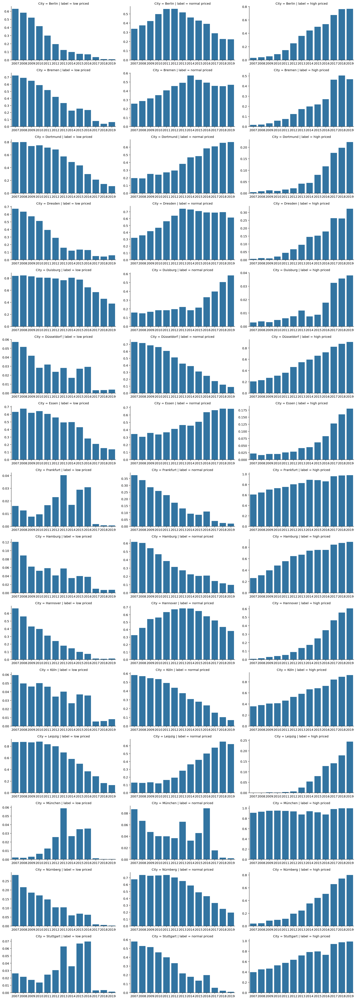

In [147]:
g = sns.FacetGrid(data=summary, col='label', row='City', sharex=False, sharey=False, col_order=label_order, height=3, aspect=1.8)
g.map_dataframe(sns.barplot, x='year', y='label_ratio', order=range(2007,2020,1))

### Changes in rent per sqm 

In [57]:
labels = df.label.unique()

In [58]:
changes = pd.DataFrame()

for label in labels:
    change_df = summary.query('label == @label').pivot(index='City', columns='year', values='rent_sqm_mean').fillna(method = 'bfill', axis=1)
    changes = changes.append(pd.Series(change_df[2019] / change_df[2007] * 100 - 100, name=label))
    

In [59]:
changes = changes.T.reset_index().melt(id_vars='index')

In [61]:
changes.columns=['City', 'label', 'percentual_change_rent_sqm']

In [62]:
changes = changes.sort_values(by=['label', 'percentual_change_rent_sqm'], ascending = False)

<Figure size 864x648 with 0 Axes>

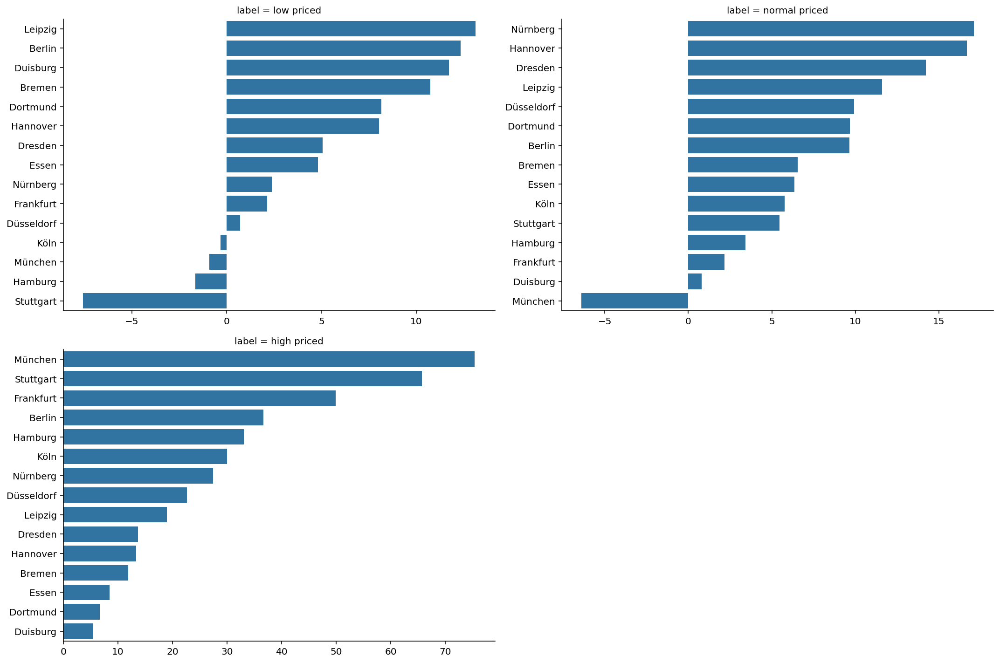

In [63]:
g = sns.FacetGrid(data=changes, col='label', col_wrap=2, sharey=False, sharex=False, col_order=label_order, height=5, aspect=1.5)
plt.figure(figsize=(12,9))
g.map_dataframe(sns.barplot, x='percentual_change_rent_sqm', y='City')


### Outcome
* 

In [67]:
min_changes['min_max'] = 'min'
max_changes['min_max'] = 'max'



In [68]:
min_changes

,City,label,percentual_change_rent_sqm,min_max
34,Duisburg,high priced,5.496580,min
29,Stuttgart,low priced,-7.581008,min
12,München,normal priced,-6.403957,min


In [70]:
min_max = pd.concat([min_changes, max_changes], axis=0)

In [71]:
min_max.City = min_max.City + '_' + min_max.min_max



In [72]:
cities = min_max.City.values
min_max.sort_values(by=['min_max', 'label'], ascending=False)


,City,label,percentual_change_rent_sqm,min_max
12,München_min,normal priced,-6.403957,min
29,Stuttgart_min,low priced,-7.581008,min
34,Duisburg_min,high priced,5.496580,min
13,Nürnberg_max,normal priced,17.088175,max
26,Leipzig_max,low priced,13.118422,max
42,München_max,high priced,75.319223,max


In [73]:
cities=['Dortmund', 'Duisburg', 'Duisburg', 'Duisburg', 'München', 'Stuttgart', 'Berlin', 'München', 'Stuttgart', 'Nürnberg']

Text(0.5, 1.0, 'Minimum and maximum price changes of appartments and the corresponding cities')

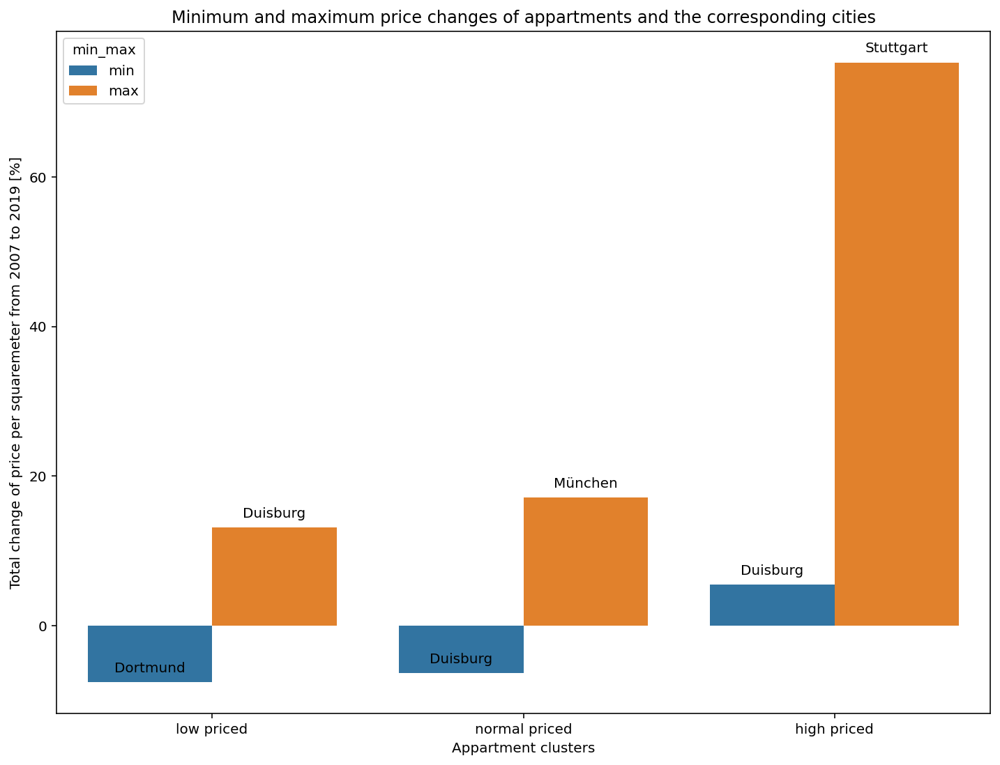

In [75]:
plt.figure(figsize=(12,9))
splot = sns.barplot(data=min_max, x='label', y='percentual_change_rent_sqm', hue='min_max', order=label_order)
for i, p in enumerate(splot.patches):
    #print(cities[i], format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()))
    splot.annotate(cities[i], (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

plt.xlabel('Appartment clusters')
plt.ylabel('Total change of price per squaremeter from 2007 to 2019 [%]')
plt.title('Minimum and maximum price changes of appartments and the corresponding cities')

#format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height())

### Changes in wohnflaeche

In [57]:
labels = df.label.unique()

In [79]:
changes = pd.DataFrame()

for label in labels:
    change_df = summary.query('label == @label').pivot(index='City', columns='year', values='wohnflaeche_mean').fillna(method = 'bfill', axis=1)
    changes = changes.append(pd.Series(change_df[2019] / change_df[2007] * 100 - 100, name=label))
    

In [80]:
changes = changes.T.reset_index().melt(id_vars='index')

In [83]:
changes.columns=['City', 'label', 'percentual_change_wohnflaeche']

In [84]:
changes = changes.sort_values(by=['label', 'percentual_change_wohnflaeche'], ascending = False)

<Figure size 864x648 with 0 Axes>

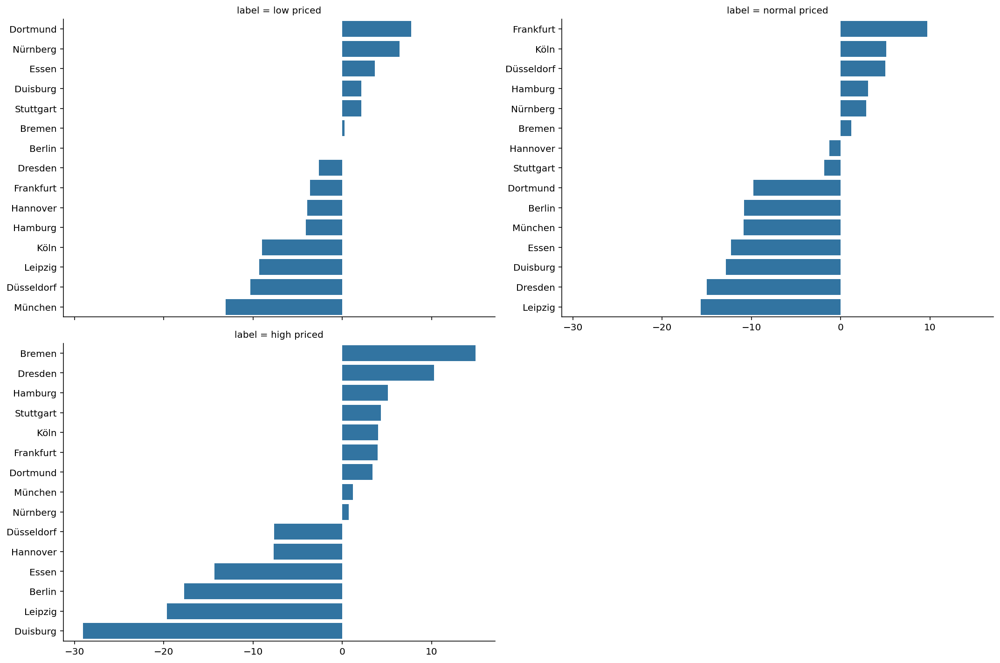

In [96]:
g = sns.FacetGrid(data=changes, col='label', col_wrap=2, sharey=False, sharex=True, col_order=label_order, height=5, aspect=1.5)
plt.figure(figsize=(12,9))
g.map_dataframe(sns.barplot, x='percentual_change_wohnflaeche', y='City')


In [87]:
min_changes['min_max'] = 'min'
max_changes['min_max'] = 'max'



In [88]:
min_changes

,City,label,percentual_change_rent_sqm,min_max
34,Duisburg,high priced,5.496580,min
29,Stuttgart,low priced,-7.581008,min
12,München,normal priced,-6.403957,min


In [89]:
min_max = pd.concat([min_changes, max_changes], axis=0)

In [90]:
min_max.City = min_max.City + '_' + min_max.min_max



In [91]:
cities = min_max.City.values
min_max.sort_values(by=['min_max', 'label'], ascending=False)


,City,label,percentual_change_rent_sqm,min_max
12,München_min,normal priced,-6.403957,min
29,Stuttgart_min,low priced,-7.581008,min
34,Duisburg_min,high priced,5.496580,min
13,Nürnberg_max,normal priced,17.088175,max
26,Leipzig_max,low priced,13.118422,max
42,München_max,high priced,75.319223,max


In [92]:
cities=['Dortmund', 'Duisburg', 'Duisburg', 'Duisburg', 'München', 'Stuttgart', 'Berlin', 'München', 'Stuttgart', 'Nürnberg']

Text(0.5, 1.0, 'Minimum and maximum wohnflaeche changes of appartments and the corresponding cities')

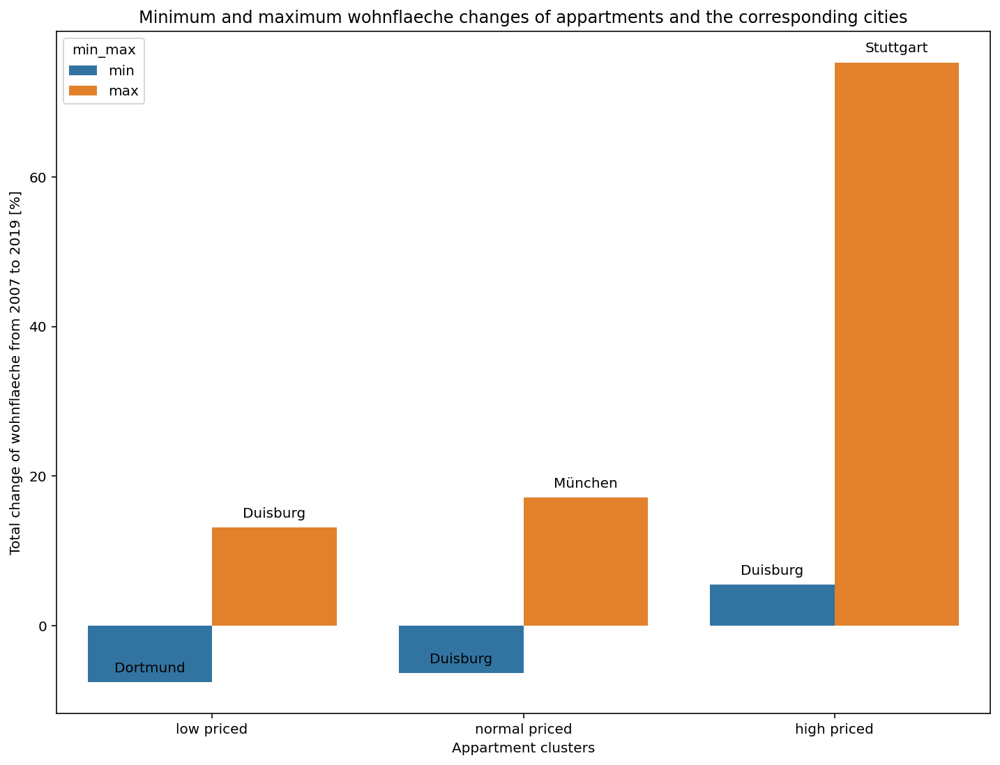

In [95]:
plt.figure(figsize=(12,9))
splot = sns.barplot(data=min_max, x='label', y='percentual_change_rent_sqm', hue='min_max', order=label_order)
for i, p in enumerate(splot.patches):
    #print(cities[i], format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()))
    splot.annotate(cities[i], (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

plt.xlabel('Appartment clusters')
plt.ylabel('Total change of wohnflaeche from 2007 to 2019 [%]')
plt.title('Minimum and maximum wohnflaeche changes of appartments and the corresponding cities')

#format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height())

### Wie hat sich das Angebot der Cluster verändert

In [98]:
summary_ausstatung.head()

,City,year,label,ausstattung,mietekalt_mean,wohnflaeche_mean,baujahr_mean,rent_sqm_mean,laufzeittage_mean,anzahletagen_mean,zimmeranzahl_mean,schlafzimmer_mean,label_ratio
0,Berlin,2007,high priced,Gehoben,853.242903,81.890000,1945.148148,10.418878,48.516129,5.464286,2.532258,1.583333,0.104027
1,Berlin,2007,high priced,Luxus,1064.666667,104.608333,1932.500000,10.148727,84.000000,4.666667,2.750000,1.500000,0.428571
2,Berlin,2007,high priced,Normal,912.900000,96.124445,1955.125000,9.454166,63.444444,5.250000,2.722222,1.444444,0.017928
3,Berlin,2007,high priced,Unbekannt,849.105702,86.032726,1957.341243,9.875049,36.988147,4.520588,2.631940,1.629356,0.032716
4,Berlin,2007,low priced,Einfach,269.591154,59.988846,1937.800000,4.588611,40.346154,6.000000,1.923077,1.250000,0.764706


In [114]:
cluster_count = df.groupby(['City', 'year', 'label']).size().reset_index(name='count')

In [150]:
cluster_count.head()

,City,year,label,count
0,Berlin,2007,high priced,1649
1,Berlin,2007,low priced,31348
2,Berlin,2007,normal priced,16848
3,Berlin,2008,high priced,2117
4,Berlin,2008,low priced,29239


In [158]:
cluster_count.query('label == "normal priced"').pivot(index='City', columns='year', values='count')

year,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
City,,,,,,,,,,,,,
Berlin,16848,18865,21123,24773,27690,27749,25847,23078,21515,19728,14479,11390,11186
Bremen,1807,2006,2211,2482,2847,3183,3427,4012,3661,3452,3199,3178,3250
Dortmund,1391,1346,1756,1699,1906,2048,2689,3233,3385,4103,4279,4607,4618
Dresden,4787,5348,6170,6926,8432,9744,11127,11128,10671,10315,10309,10415,9291
Duisburg,1111,1033,1174,1291,1301,1394,1546,1294,1487,2370,2792,3529,4110
Düsseldorf,10951,10778,10343,9912,9180,7709,6264,5768,4638,3691,2602,1812,1327
Essen,2413,2118,2532,2381,2585,2873,3278,3237,3521,4444,4672,4753,4719
Frankfurt,5672,5115,4276,3896,3414,2621,1952,1381,1266,1637,593,359,295
Hamburg,9366,9037,8131,6998,5745,4699,4063,3394,3079,3138,2153,1740,1470


In [165]:
changes = pd.DataFrame()

for label in labels:
    change_df = cluster_count.query('label == @label').pivot(index='City', columns='year', values='count')
    changes = changes.append(pd.Series(change_df[2019] / change_df[2007] * 100 - 100, name=label))
    
    

In [166]:
changes = changes.T.reset_index().melt(id_vars='index')

In [167]:
changes.columns=['City', 'label', 'percentual_change_count']

In [168]:
changes = changes.sort_values(by=['label', 'percentual_change_count'], ascending = False)

In [169]:
changes

,City,label,percentual_change_count
11,Leipzig,normal priced,374.182004
4,Duisburg,normal priced,269.936994
2,Dortmund,normal priced,231.991373
6,Essen,normal priced,95.565686
3,Dresden,normal priced,94.088155
1,Bremen,normal priced,79.856115
9,Hannover,normal priced,18.098160
0,Berlin,normal priced,-33.606363
13,Nürnberg,normal priced,-71.148164
8,Hamburg,normal priced,-84.304933


<Figure size 864x648 with 0 Axes>

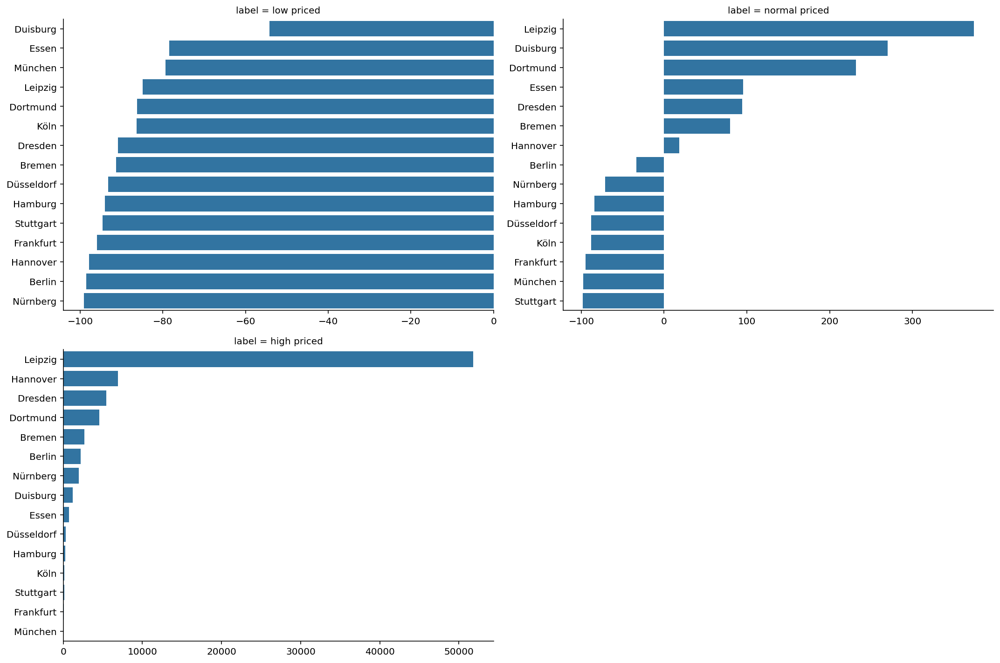

In [171]:
g = sns.FacetGrid(data=changes, col='label', col_wrap=2, sharey=False, sharex=False, col_order=label_order, height=5, aspect=1.5)
plt.figure(figsize=(12,9))
g.map_dataframe(sns.barplot, x='percentual_change_count', y='City')


In [152]:
cluster_count
#.pivot(^index='City', columns='year', values='count')

,City,year,label,count
0,Berlin,2007,high priced,1649
1,Berlin,2007,low priced,31348
2,Berlin,2007,normal priced,16848
3,Berlin,2008,high priced,2117
4,Berlin,2008,low priced,29239
...,...,...,...,...
580,Stuttgart,2018,low priced,24
581,Stuttgart,2018,normal priced,155
582,Stuttgart,2019,high priced,6902
583,Stuttgart,2019,low priced,10


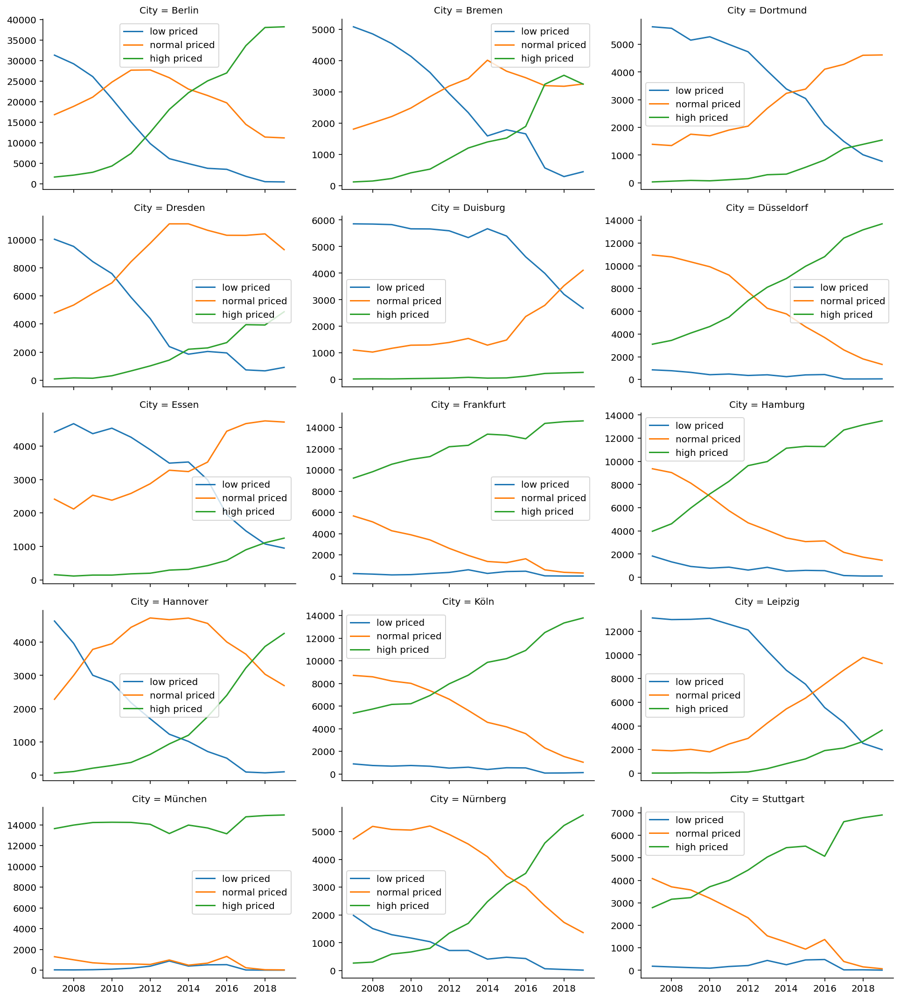

In [119]:
g = sns.FacetGrid(data=cluster_count, col='City', col_wrap=3, height=3, aspect=1.5, sharey=False)
g.map_dataframe(sns.lineplot, x='year', y='count', hue='label', hue_order=label_order)

for ax in g.axes.ravel():
    ax.legend()



In [ ]:
df.to_pickle('data/rent_clustering_done.pkl')

In [ ]:
min_changes

In [ ]:
134000 / 356 / 4